# DataLoaders in PyTorch
In molti casi pratici il dataset potrebbe essere troppo grande per essere caricato in memoria, oppure, potrebbero essere salvati in formati diversi, come file immagine, file audio, file testo, ecc. 

Se disponiamo di un numero elevato di CPU core possiamo sfruttare il parallelismo per caricare i dati in parallelo, in modo da ridurre i tempi di accesso.

Potrebbe anche essere necessario fare operazioni preliminari sui dati prima di passarli al modello, come cropping, resizing, normalizzazione, ecc.

Così facendo separo le operazioni di accesso ai dati e le operazioni legate al modello, in modo da rendere il codice più modulare e più facile da mantenere. 
Quindi voglio avere un generatore di mini batches, che carichi i dati in parallelo e faccia le operazioni preliminari sui dati, senza curarmi di come vengono effettuate queste operazioni.
I `DataLoader` servono prorpio a questo scopo, permettono di astrarre il processo di caricamneto e manipolazione dei dati. Possono essere facilmente composti per costruire pipeline di accesso ai dati.

Il dataset utilizzato in questo esempio è il __Galaxy10 DECaLS__, che contiene immagini di galassie classificate in 10 classi. ( link : https://astronn.readthedocs.io/en/latest/galaxy10.html )

In [1]:
from math import degrees

import torch
from torch.utils.data import Dataset, DataLoader

import numpy as np
import tables

Il dataset si trova in un file HDF5, che contiene le immagini e le etichette. Viene definita una classe che naviga all'intenro del file e prende i dati di interesse, applicando varie operazioni.

La classe `GalaxyDataset` eredita dalla classe `Dataset` di PyTorch: nel metodo `__init__` vengono caricati i dati dal file HDF5 e normalizzati, `len` restituisce il numero di esempi che verrà usato dal DataLoader per capire il numero di minibatch in un'epoca e `__getitem__` restituisce l'i-esimo elemento del dataset.

In particolare si trova `crop = True`, se è vero voglio ritagliare l'immagine in modo da averne una 224 x 244 ( le dimensioni originali sono di 256 x 256). Lo faccio perchè non perdo dati, nonostante l'immagine più piccola. Inoltre è un formato popolare, usato per la definizione di varie costanti in molti modelli.

In [3]:
class GalaxyDataset(Dataset):
    def __init__(self, opts, filename, crop = True):
        self.opts = opts
        h5 = tables.File(filename) # apre il file HDF5
        X = h5.root.images[:] # carica le immagini
        y = h5.root.ans[:] # carica le etichette
        
        X = (X/255).astype(np.float32) # normalizza le immagini
        self.X = torch.tensor(X.transpose(0, 3, 1, 2)) # trasforma le immagini in tensori
        
        if crop: 
            margin = (256 - 224) // 2 # calcola il margine
            self.X = self.X[:,:,margin:-margin,margin:-margin] # ritaglia le immagini
            
        self.num_classes = len(np.unique(y)) # calcola il numero di classi
        EYE = np.eye(self.num_classes) # crea una matrice identità
        self.y = torch.tensor(EYE[y]) # trasforma le matrice identità in tensori
        self.data_shape = X[0].shape # salva la forma delle immagini
        
    def __len__(self):
        return self.X.shape[0] # restituisce il numero di esempi
    
    def __getitem__(self, i):
        return self.X[i], self.y[i] # restituisce l'i-esimo esempio        

Adesso costruiamo i DataLoaders, basterà creare un oggetto della classe `DataLoaders` usando un oggetto della classe appena sviluppata.

Nel caso di dataset sbilanciati, lo split usato per dividere train e test non garantisce che le proporzioni delle classi nei diversi minibarch saranno tutte uguali.

In [4]:
class MakeDataLoaders():
    def __init__(self, opts, data):
        generator = torch.Generator().manual_seed(opts.seed) # inizializza il generatore di numeri casuali
        train, test = torch.utils.data.random_split(data,
                                                    lengths = [1-opts.test_size, opts.test_size],
                                                    generator = generator) # divide il dataset in training e test set
        
        self.train = DataLoader(train, batch_size = opts.batch_size, shuffle = True) # crea il DataLoader per il training set
        self.test = DataLoader(test, batch_size = opts.batch_size, shuffle = True) # crea il DataLoader per il test set

Vediamo che elementi si trovano all'interno del dataset, in modo da capire con che tipo di dati stiamo lavorando.

torch.Size([8, 3, 224, 224])


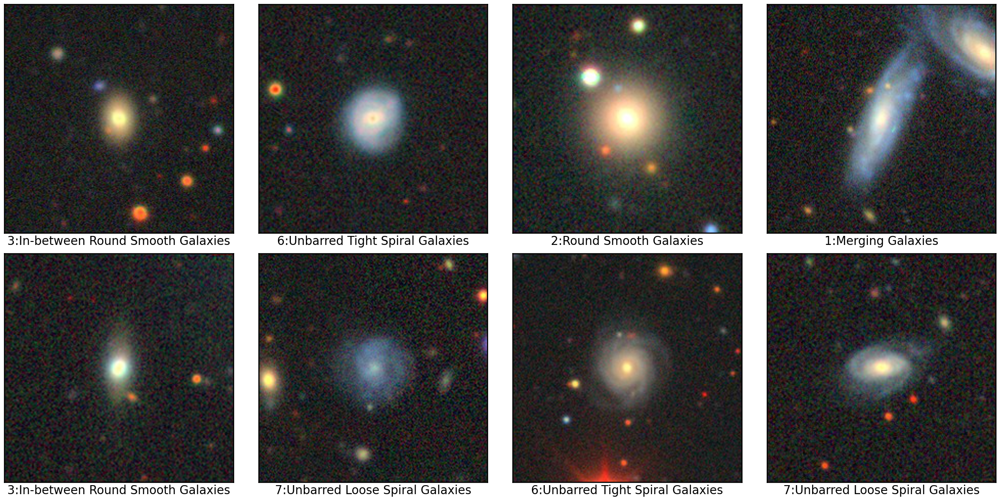

In [5]:
from types import SimpleNamespace
from ipdb import launch_ipdb_on_exception
from helpers import plot

opts = SimpleNamespace()
opts.seed = 1234
opts.test_size = 0.2
opts.batch_size = 8

with launch_ipdb_on_exception():
    data = GalaxyDataset(opts, 'Galaxy10_DECals.h5')
    loaders = MakeDataLoaders(opts, data)
    train = loaders.train 
    
    done = 0
    for X,y in train:
        print(X.shape)
        plot(
            [[xx for xx in X[:opts.batch_size//2]], [xx for xx in X[opts.batch_size//2:]]],
            [[yy for yy in y[:opts.batch_size//2]], [yy for yy in y[opts.batch_size//2:]]]
        )
        done += 1
        if done == 1:
            break

Sono stati mostrati degli esempi, ciascuno con la prorpia classe di appartenenza. Ogni gruppo di immagini è ciò che viene ritornato dal DataLoader nel ciclo for.

A questo punto parliamo di __augmentation__, ovvero di come possiamo modificare i dati in modo da aumentare la varietà del dataset. Questo è utile per evitare l'overfitting e per migliorare le prestazioni del modello.
L'idea è quella di creare esempi sintetici modificando le istanze con delle strasformazioni, ottenendo dati ragionevoli e verosimili.
Nel caso di queste immagini potrei ruotarle e non avrei cambiamenti della classe di appartenenza, oppure potrei fare uno zoom etc.

In generale si campiona un minibatch, si campionano dei parametri di augmentazione (es angolo di rotazione campionato da una certa distribuzione) e si applicano le trasformazioni ai dati. In questa modalità l'ottimizzazione opera su in dataset virtuale illimitato. 
L'uso del DataLoader perchè i minibatch con i dati aumentati vengono generati in modo trasparente, senza che il modello debba preoccuparsi di come sono stati generati. 

In [4]:
from torchvision.transforms import v2 

class AugmentedDataSet(GalaxyDataset):
    def __init__(self, opts, filename):
        super().__init__(opts, filename, crop=False) # inizializzo la classe padre, crop = False per evitare che faccia il crop, li faccio a mano tramite pipeline
        self.augmentation_pipeline = v2.Compose(  # Compose accetta una lista di trasformazioni 
            [
                v2.RandomRotation(degrees=self.opts.rotation_degrees, expand=False), # ruota l'immagine di un angolo casuale
                v2.RandomCrop(size=224), # ritaglia l'immagine in modo casuale
                v2.RandomHorizontalFlip(p=self.opts.horizontal_flip_prob), # fa lo flip orizzontale con una certa probabilità
                v2.RandomVerticalFlip(p=self.opts.vertical_flip_prob) # fa lo flip verticale con una certa probabilità
            ]
        )
        
    def __getitem__(self, i):
        return self.augmentation_pipeline(self.X[i], self.y[i]) # richiamo la pipeline di augmentazione sulle immagini e ritorno anche la sua label   

Andrò a vedere il comportamento di questa classe con un codice simile a quello visto precedentemente, impostanto i corretti valori per _opts_.
Per esempio: _opts.rotation_degrees = (0,180)_ significa che l'immagine può essere ruotata di un angolo compreso tra 0 e 180 gradi, _opts.horizontal_flip_prob = 0.5_ significa che l'immagine può essere ruotata con una probabilità del 50% e _opts.vertical_flip_prob = 0.5_ significa che l'immagine può essere ruotata con una probabilità del 50%. 

torch.Size([8, 3, 224, 224])


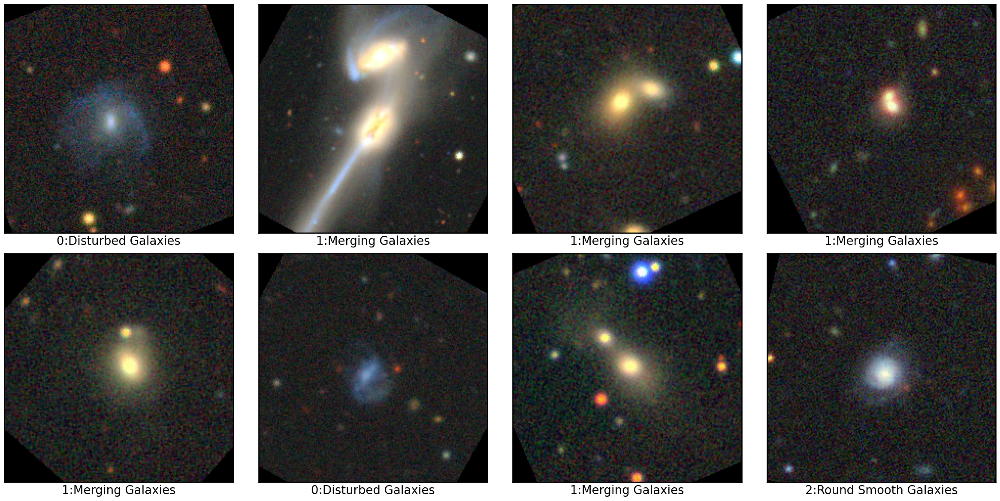

In [5]:
from types import SimpleNamespace 
from ipdb import launch_ipdb_on_exception
from helpers import plot

opts = SimpleNamespace()
opts.seed = 1234
opts.test_size = 0.2
opts.batch_size = 8
opts.rotation_degrees = (0,180)
opts.horizontal_flip_prob = 0.5
opts.vertical_flip_prob = 0.5

with launch_ipdb_on_exception():
    data = AugmentedDataSet(opts, 'Galaxy10_DECals.h5')
    loaders = MakeDataLoaders(opts, data) 
    train = loaders.train 
    
    done = 0
    for X,y in train:
        print(X.shape)
        plot(
            [[xx for xx in X[:opts.batch_size//2]], [xx for xx in X[opts.batch_size//2:]]],
            [[yy for yy in y[:opts.batch_size//2]], [yy for yy in y[opts.batch_size//2:]]]
        )
        done += 1
        if done == 1:
            break